<a href="https://colab.research.google.com/github/ArifAygun/Magnimind-Capstone-Projects/blob/main/AA_Capstone_Project_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

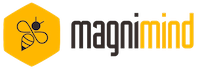


#**ARIF AYGUN CAPSTONE PROJECT 2**
#**(Telecom Churn Prediction)**

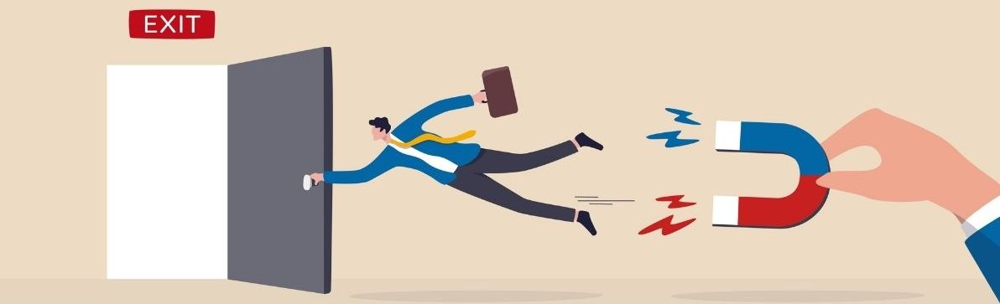

##**A. Objectives the Project**

- This project is about a very common business problem: analyzing customer churn. 
- Identify telecom service customers who are more likely to stop using the service in the future.
- Create a model that can predict if a certain customer will drop the service.
- Predict the features that are most important in customer churn.

## **1. Loading Libraries and Dataset**

####**1.1. Libraries and Modules**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm, skew
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

#### **1.2 Load Dataset**

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

%cd /content/drive/My Drive/Datasets/

df = pd.read_csv("churn.csv")

Mounted at /content/drive/
/content/drive/My Drive/Datasets


##**2.  Summarizing the Data**

####**2.1. Descriptive Statistics**

In [3]:
df.head()

,state,account_length,area_code,phone_number,intl_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churned
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,?,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [4]:
#brief information about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   object 
 1   account_length                 5000 non-null   int64  
 2   area_code                      5000 non-null   int64  
 3   phone_number                   5000 non-null   object 
 4   intl_plan                      5000 non-null   object 
 5   voice_mail_plan                5000 non-null   object 
 6   number_vmail_messages          5000 non-null   int64  
 7   total_day_minutes              5000 non-null   float64
 8   total_day_calls                5000 non-null   int64  
 9   total_day_charge               5000 non-null   float64
 10  total_eve_minutes              5000 non-null   float64
 11  total_eve_calls                5000 non-null   int64  
 12  total_eve_charge               5000 non-null   o

In [5]:
# Display the columns (features of the data)
df.columns

Index(['state', 'account_length', 'area_code', 'phone_number', 'intl_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churned'],
      dtype='object')

Firstly, we can see that the dataset contains several numerical and categorical columns providing various information on use of the services and the customer contract.

In [6]:
#check the number of columns and rows
df = pd.DataFrame(df)
rows = len(df.axes[0])
columns = len(df.axes[1])
print("Number of Rows: ", rows)
print("Number of Columns: ", columns)

Number of Rows:  5000
Number of Columns:  21


In [7]:
#looking for the description of the data
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
state,5000,51,WV,158,NaN,NaN,NaN,NaN,NaN,NaN,NaN
account_length,5000.0,NaN,NaN,NaN,100.2586,39.69456,1.0,73.0,100.0,127.0,243.0
area_code,5000.0,NaN,NaN,NaN,436.9114,42.209182,408.0,408.0,415.0,415.0,510.0
phone_number,5000,5000,382-4657,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
intl_plan,5000,2,no,4527,NaN,NaN,NaN,NaN,NaN,NaN,NaN
voice_mail_plan,5000,2,no,3677,NaN,NaN,NaN,NaN,NaN,NaN,NaN
number_vmail_messages,5000.0,NaN,NaN,NaN,7.7552,13.546393,0.0,0.0,0.0,17.0,52.0
total_day_minutes,5000.0,NaN,NaN,NaN,180.2889,53.894699,0.0,143.7,180.1,216.2,351.5
total_day_calls,5000.0,NaN,NaN,NaN,100.0294,19.831197,0.0,87.0,100.0,113.0,165.0
total_day_charge,5000.0,NaN,NaN,NaN,30.649668,9.162069,0.0,24.43,30.62,36.75,59.76


**Breakdown of the features of dataset:**

- ```state```:51 Uniques state names.

- ```account_length```: Length of the Accounts.

- ```area_code```: Code number of area of tthe states.

- ```intl_plan```: It has two input 'Yes' or 'No'. 'Yes' indicates the subscription of the plan and 'No' indicates the non subscription the plan.

- ```voice_mail_plan```: It has two input 'Yes' or 'No'. 'Yes' indicates the presence of voice plan and 'No' indicates the absence of voice plan.

- ```number_vmail_messages```: The number of voice messages ranging from 0 to 52.

- ```total_day_minutes```: Total minutes spent in day.

- ```total_day_calls```: Total number of calls made in day.

- ```total_day_charge```: Total charge that customer consumed in day.

- ```total_eve_minutes```: Total number of minutes spend in evening.

- ```total_eve_calls```: Total number of calls made in evening.

- ```total_eve_charge```: Total charge that customer consumed in evening.

- ```total_night_minutes```: Total number of minutes spend in night.

- ```total_night_calls```: Total number of calls made in night.

- ```total_night_charge```: Total charge that customer consumed in night.

- ```total_intl_minutes```: Total number of minutes spend in international calls

- ```total_intl_calls```: Total number of calls made in international calls

- ```total_intl_charge```: Total charge that customer consumed in international calls     

- ```number_customer_service_calls```: Number of service calls made by the customer.

- ```churned```: customer churn, if 'True' means churned customer, if 'False' means retained customer. This dependent variable is target variable.

####**2.2. Data Visualization**

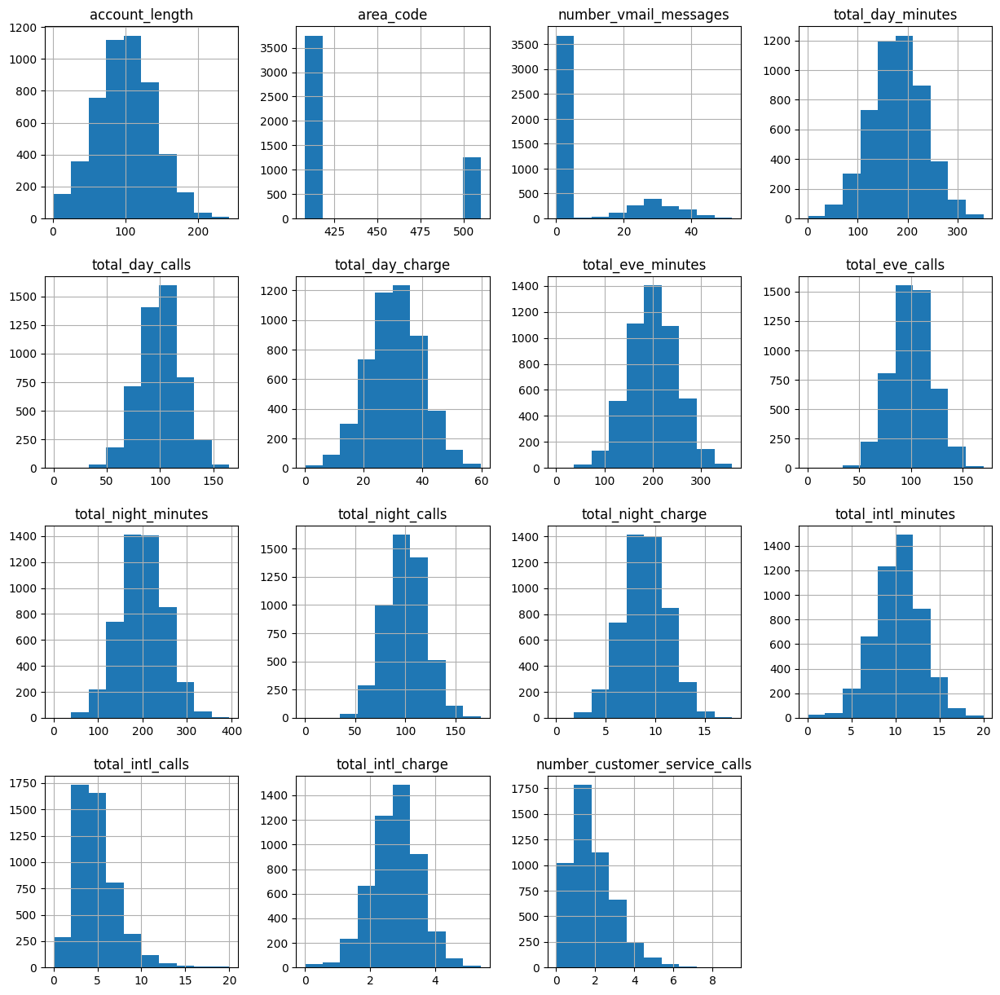

In [8]:
df.hist(figsize = (15, 15))
plt.show()

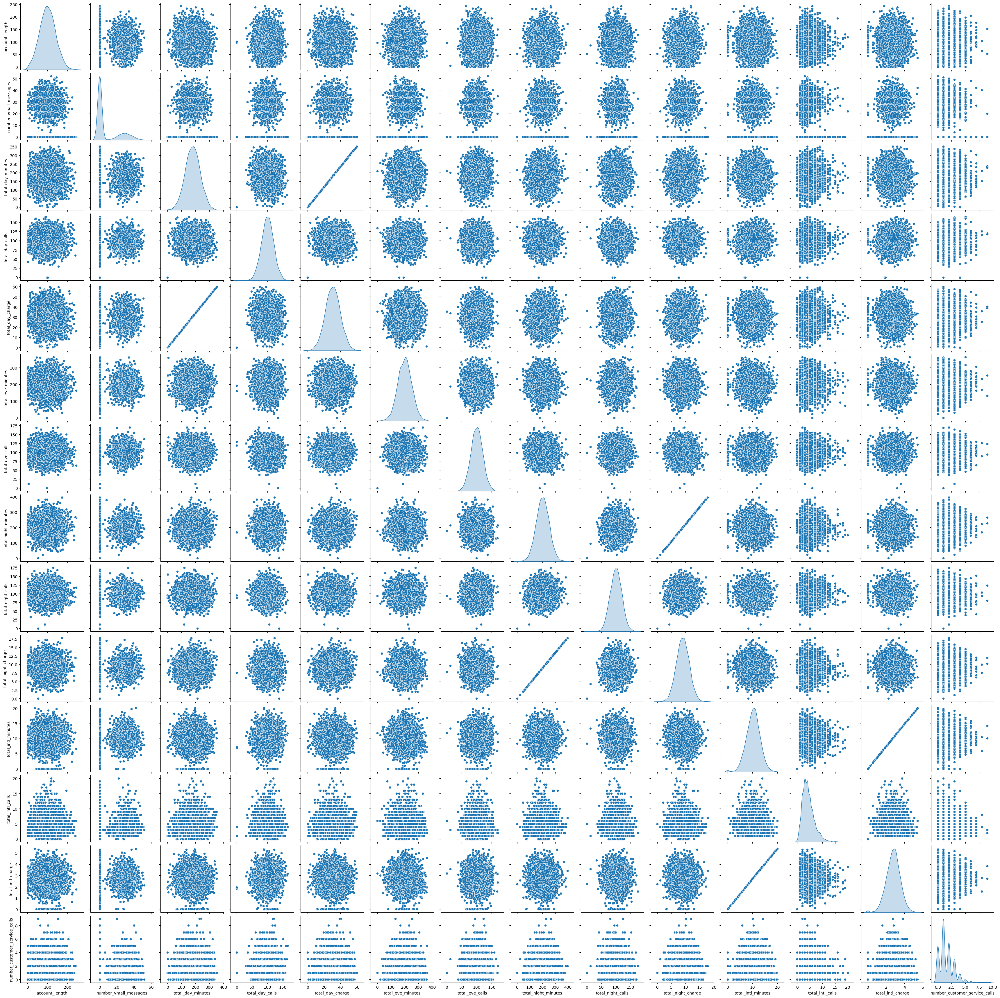

In [9]:
#Separating columns to be visualized
out_cols = list(set(df.nunique()[df.nunique()<6].keys().tolist()
                    + df.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in df.columns if x not in out_cols] + ['churned']

sns.pairplot(df[viz_cols], diag_kind="kde")
plt.show()

There are three variables abnormal according to histograms and pair plot:
- ```number_vmail_messages```
- ```total_intl_calls```
- ```number_customer_service_calls```

And also there are three high corralated variable pairs:
- ```total_day_minutes``` vs ```total_day_charge```
- ```total_night_minutes``` vs ```total_night_charge```
- ```total_intl_minutes``` vs ```total_intl_charge```

##**3. Prepare Data**

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   object 
 1   account_length                 5000 non-null   int64  
 2   area_code                      5000 non-null   int64  
 3   phone_number                   5000 non-null   object 
 4   intl_plan                      5000 non-null   object 
 5   voice_mail_plan                5000 non-null   object 
 6   number_vmail_messages          5000 non-null   int64  
 7   total_day_minutes              5000 non-null   float64
 8   total_day_calls                5000 non-null   int64  
 9   total_day_charge               5000 non-null   float64
 10  total_eve_minutes              5000 non-null   float64
 11  total_eve_calls                5000 non-null   int64  
 12  total_eve_charge               5000 non-null   o

There is only one missing value in ```total_intl_charge``` column. We will impute this row in Data Cleaning section.

In [11]:
# check for duplicated rows
df.duplicated().sum()

0

There is no duplicated value.

####**3.2. Numerical and Categorical Features**

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   object 
 1   account_length                 5000 non-null   int64  
 2   area_code                      5000 non-null   int64  
 3   phone_number                   5000 non-null   object 
 4   intl_plan                      5000 non-null   object 
 5   voice_mail_plan                5000 non-null   object 
 6   number_vmail_messages          5000 non-null   int64  
 7   total_day_minutes              5000 non-null   float64
 8   total_day_calls                5000 non-null   int64  
 9   total_day_charge               5000 non-null   float64
 10  total_eve_minutes              5000 non-null   float64
 11  total_eve_calls                5000 non-null   int64  
 12  total_eve_charge               5000 non-null   o

We can see that the data contains several numerical and categorical columns providing various information on use of the services and the customer contract.

In [13]:
#describing the categorical columns
df.describe(include='object').T

,count,unique,top,freq
state,5000,51,WV,158
phone_number,5000,5000,382-4657,1
intl_plan,5000,2,no,4527
voice_mail_plan,5000,2,no,3677
total_eve_charge,5000,1660,15.9,15
churned,5000,2,False.,4293


In [14]:
#describing the numerical columns
df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
account_length,5000.0,100.26,39.69,1.0,73.00,100.00,127.00,243.00
area_code,5000.0,436.91,42.21,408.0,408.00,415.00,415.00,510.00
number_vmail_messages,5000.0,7.76,13.55,0.0,0.00,0.00,17.00,52.00
total_day_minutes,5000.0,180.29,53.89,0.0,143.70,180.10,216.20,351.50
total_day_calls,5000.0,100.03,19.83,0.0,87.00,100.00,113.00,165.00
total_day_charge,5000.0,30.65,9.16,0.0,24.43,30.62,36.75,59.76
total_eve_minutes,5000.0,200.64,50.55,0.0,166.38,201.00,234.10,363.70
total_eve_calls,5000.0,100.19,19.83,0.0,87.00,100.00,114.00,170.00
total_night_minutes,5000.0,200.39,50.53,0.0,166.90,200.40,234.70,395.00
total_night_calls,5000.0,99.92,19.96,0.0,87.00,100.00,113.00,175.00


####**3.3. Missing Values**

In [15]:
df_datatype = pd.concat([df.dtypes, df.nunique(),
                         round(df.nunique()*100/len(df), 2),
                         df.isnull().sum(),
                         round(df.isnull().sum()*100/len(df),2)],
                        axis=1)
df_datatype

,0,1,2,3,4
state,object,51,1.02,0,0.00
account_length,int64,218,4.36,0,0.00
area_code,int64,3,0.06,0,0.00
phone_number,object,5000,100.00,0,0.00
intl_plan,object,2,0.04,0,0.00
voice_mail_plan,object,2,0.04,0,0.00
number_vmail_messages,int64,48,0.96,0,0.00
total_day_minutes,float64,1961,39.22,0,0.00
total_day_calls,int64,123,2.46,0,0.00
total_day_charge,float64,1961,39.22,0,0.00


There is only one missing value 0.02% in total_intl_charge column. We will impute this row in Data Cleaning section.

- ```intl_plan```, ```voice_mail_plan```, ```state```, ```phone_number```, ```area_code``` and ```churned``` (dependent - target variable) are categorical variables.
- The other variables are continous. 

####**3.4. Deleting no Significance Variables**

Three variables in the dataset (```state```, ```phone_number```, ```area_code```) which are categorical and having no meaning or significance for the analysis. Then, it is better to delete them from the dataset. 

In [16]:
df1 = df.drop(['state', 'area_code', 'phone_number'], axis =1)

In [17]:
df1.head()

,account_length,intl_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churned
0,128,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,107,no,yes,26,161.6,123,27.47,195.5,103,?,254.4,103,11.45,13.7,3,3.70,1,False.
2,137,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,84,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,75,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [18]:
df1.columns.to_series().groupby(df.dtypes).groups

{int64: ['account_length', 'number_vmail_messages', 'total_day_calls', 'total_eve_calls', 'total_night_calls', 'total_intl_calls', 'number_customer_service_calls'], float64: ['total_day_minutes', 'total_day_charge', 'total_eve_minutes', 'total_night_minutes', 'total_night_charge', 'total_intl_minutes', 'total_intl_charge'], object: ['intl_plan', 'voice_mail_plan', 'total_eve_charge', 'churned']}

In [19]:
#check the number of columns and rows
df1 = pd.DataFrame(df1)
rows = len(df1.axes[0])
columns = len(df1.axes[1])
print("Number of Rows: ", rows)
print("Number of Columns: ", columns)

Number of Rows:  5000
Number of Columns:  18


In [20]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   account_length                 5000 non-null   int64  
 1   intl_plan                      5000 non-null   object 
 2   voice_mail_plan                5000 non-null   object 
 3   number_vmail_messages          5000 non-null   int64  
 4   total_day_minutes              5000 non-null   float64
 5   total_day_calls                5000 non-null   int64  
 6   total_day_charge               5000 non-null   float64
 7   total_eve_minutes              5000 non-null   float64
 8   total_eve_calls                5000 non-null   int64  
 9   total_eve_charge               5000 non-null   object 
 10  total_night_minutes            5000 non-null   float64
 11  total_night_calls              5000 non-null   int64  
 12  total_night_charge             5000 non-null   f

We have four object variables (one of them is target variable):
- ```intl_plan```
- ```voice_mail_plan```
- ```total_eve_charge```
- ```churned```

We will need to convert these variables into numbers.

###**3.5. Converting Variable Types**

In [21]:
# Change the type of categorical columns to numeric columns
df1['intl_plan'] = df1['intl_plan'].str.strip().replace({'no': 0, 'yes': 1}).astype(int)
df1['voice_mail_plan'] = df1['voice_mail_plan'].str.strip().replace({'no': 0, 'yes': 1}).astype(int)
df1['churned'] = df1['churned'].str.strip().replace({'False.': 0, 'True.': 1}).astype(int)
df1['total_eve_charge'] = pd.to_numeric(df1['total_eve_charge'], errors='coerce')

df2 = df1

In [22]:
# dataframe variables converted into numbers
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   account_length                 5000 non-null   int64  
 1   intl_plan                      5000 non-null   int64  
 2   voice_mail_plan                5000 non-null   int64  
 3   number_vmail_messages          5000 non-null   int64  
 4   total_day_minutes              5000 non-null   float64
 5   total_day_calls                5000 non-null   int64  
 6   total_day_charge               5000 non-null   float64
 7   total_eve_minutes              5000 non-null   float64
 8   total_eve_calls                5000 non-null   int64  
 9   total_eve_charge               4995 non-null   float64
 10  total_night_minutes            5000 non-null   float64
 11  total_night_calls              5000 non-null   int64  
 12  total_night_charge             5000 non-null   f

Now all variables are numeric

In [23]:
#Check missing data after variable type change
df_datatype2 = pd.concat([df2.dtypes, df2.nunique(),
                         round(df2.nunique()*100/len(df2), 2),
                         df2.isnull().sum(),
                         round(df2.isnull().sum()*100/len(df2),2)],
                        axis=1)
df_datatype2

,0,1,2,3,4
account_length,int64,218,4.36,0,0.00
intl_plan,int64,2,0.04,0,0.00
voice_mail_plan,int64,2,0.04,0,0.00
number_vmail_messages,int64,48,0.96,0,0.00
total_day_minutes,float64,1961,39.22,0,0.00
total_day_calls,int64,123,2.46,0,0.00
total_day_charge,float64,1961,39.22,0,0.00
total_eve_minutes,float64,1879,37.58,0,0.00
total_eve_calls,int64,126,2.52,0,0.00
total_eve_charge,float64,1659,33.18,5,0.10


- We have a missing values in **total_eve_charge** and **total_intl_charge** variables.

- The amount of missing values is very small. 
- ```total_eve_charge``` 0,10% 
- ```total_intl_charge``` 0,02%. 
- We can replace missing values with the median.

###**3.7. Missing Value Imputation**

In [24]:
df2.total_eve_charge.fillna(value = df2.total_eve_charge.median(), inplace = True)
df2.total_intl_charge.fillna(value = df2.total_intl_charge.mean(), inplace = True)

In [25]:
#check the percentage of missing values after median imputing.
df_datatype3 = pd.concat([df2.dtypes, df2.nunique(),
                         round(df2.nunique()*100/len(df2), 2),
                         df2.isnull().sum(),
                         round(df2.isnull().sum()*100/len(df2),2)],
                        axis=1)
df_datatype3

,0,1,2,3,4
account_length,int64,218,4.36,0,0.0
intl_plan,int64,2,0.04,0,0.0
voice_mail_plan,int64,2,0.04,0,0.0
number_vmail_messages,int64,48,0.96,0,0.0
total_day_minutes,float64,1961,39.22,0,0.0
total_day_calls,int64,123,2.46,0,0.0
total_day_charge,float64,1961,39.22,0,0.0
total_eve_minutes,float64,1879,37.58,0,0.0
total_eve_calls,int64,126,2.52,0,0.0
total_eve_charge,float64,1659,33.18,0,0.0


- There is no missing value after median imputation.

In [26]:
df2.head()

,account_length,intl_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churned
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,0,1,26,161.6,123,27.47,195.5,103,17.09,254.4,103,11.45,13.7,3,3.70,1,0
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


## **4. Exploratory Data Analysis**

Explore and visualize our data set by doing distribution of independent variables to better understand the patterns in the data.

#### **4.1. Check Target Variable Distribution**

In [27]:
df2['churned'].value_counts()

0    4293
1     707
Name: churned, dtype: int64

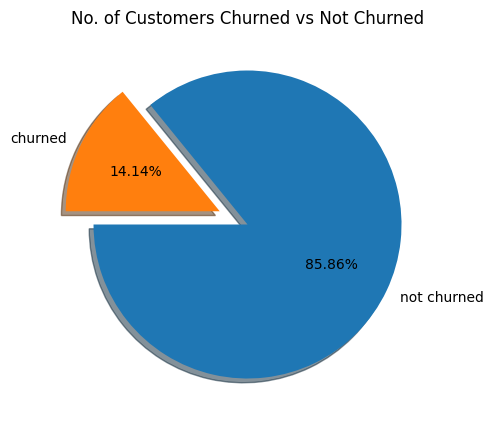

In [28]:
#Target Variable data distribution
churned = df2['churned'].value_counts()[1]
not_churned = df2['churned'].value_counts()[0]

fig = plt.figure(figsize=(5,5))
plt.pie([not_churned, churned], labels=['not churned', 'churned'], explode=(0, 0.2), \
        shadow=True, autopct="%1.2f%%", startangle=180)
plt.title('No. of Customers Churned vs Not Churned')
plt.show()

- The data set is imbalanced with a high proportion of active customers compared to their churned counterparts

#### **4.2. Check Anomalies in Dataset**

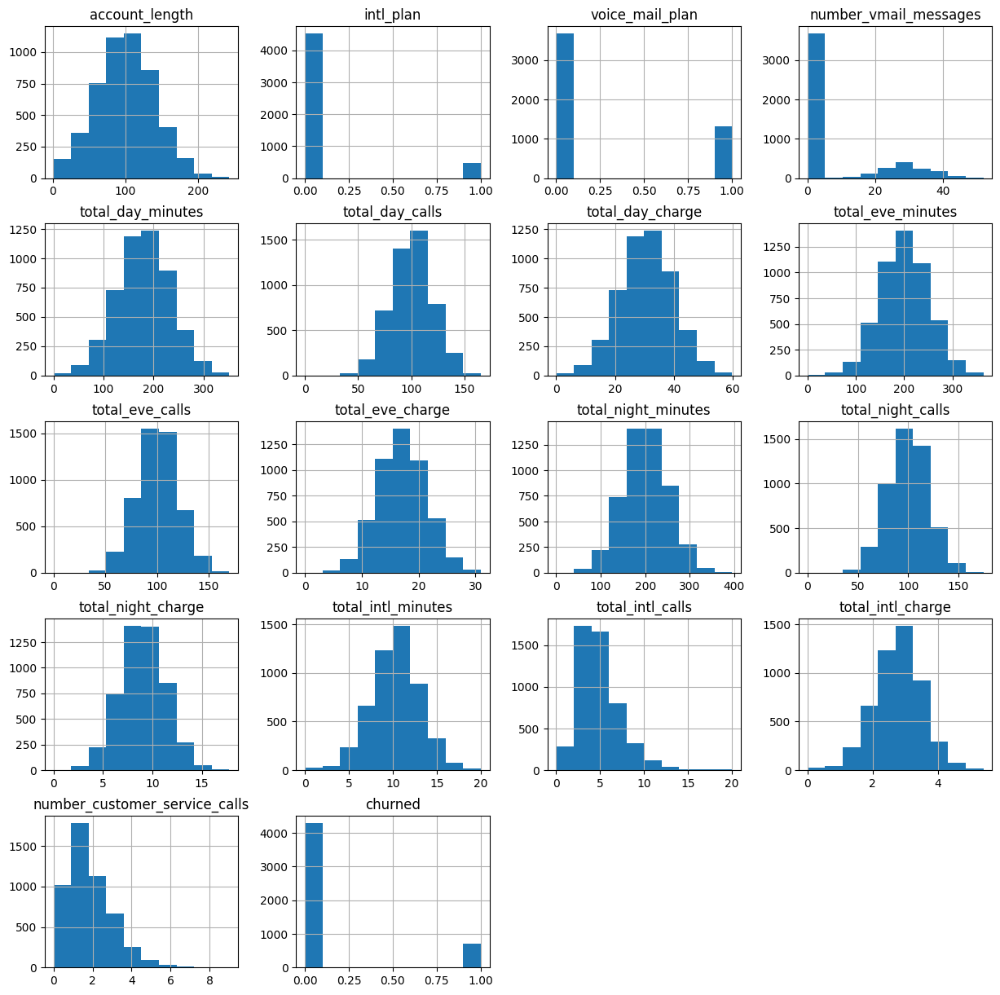

In [29]:
df2.hist(figsize = (15, 15))
plt.show()

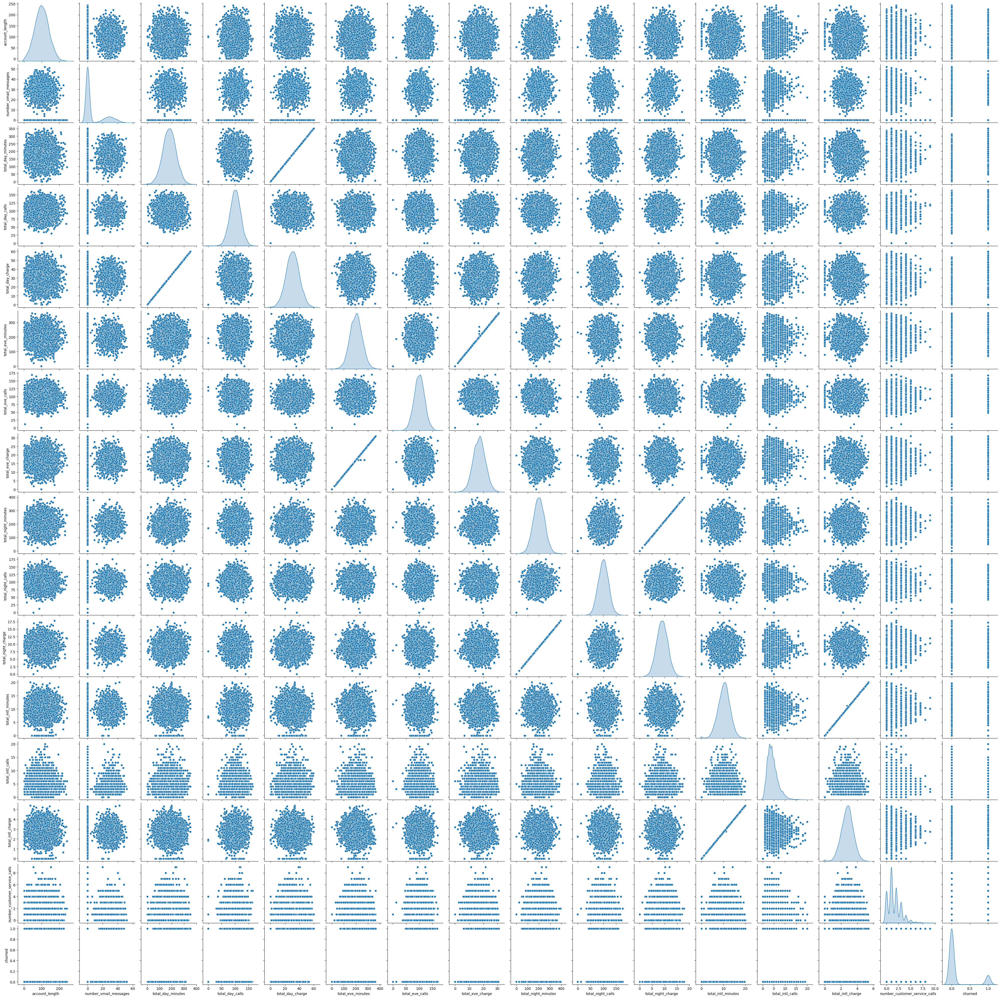

In [30]:
#Separating columns to be visualized
out_cols = list(set(df2.nunique()[df2.nunique()<6].keys().tolist()
                    + df2.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in df2.columns if x not in out_cols] + ['churned']

sns.pairplot(df2[viz_cols], diag_kind="kde")
plt.show()

- 12 variables have standart normal distribution
- 2 variables have right skewed normal distribution
- 4 variables are categorical type.
- There are 4 highly corraleted variables 

###**4.3. Checking Distribution With Respect to Target Variable**

In [31]:
#Relationational bar graph
def diff_bar(x,y):
    
    df2.groupby([x,y]).size().unstack(level=-1).plot(kind='bar', figsize=(6,3))
    plt.xlabel(x,fontsize= 12)
    plt.ylabel('count',fontsize= 12)
    plt.legend(loc=0,fontsize= 10)
    plt.xticks(fontsize=10, rotation=0)
    plt.yticks(fontsize=10)
    plt.title("{X} vs {Y}".format(X=x,Y=y),fontsize = 16)
    plt.show()

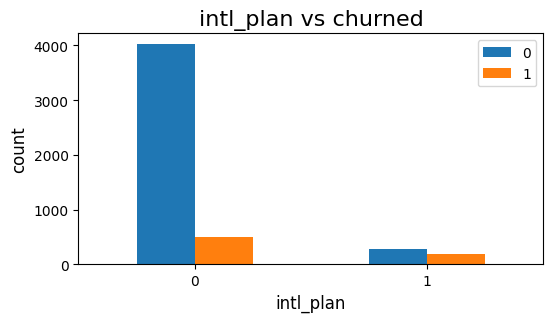

In [32]:
#intl_plan vs churning of customer
diff_bar('intl_plan','churned')

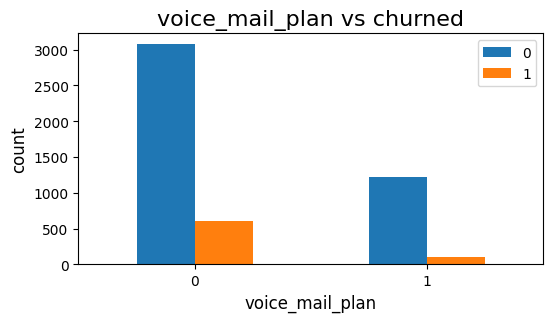

In [33]:
#Voice mail plan vs churning of customer
diff_bar('voice_mail_plan','churned')

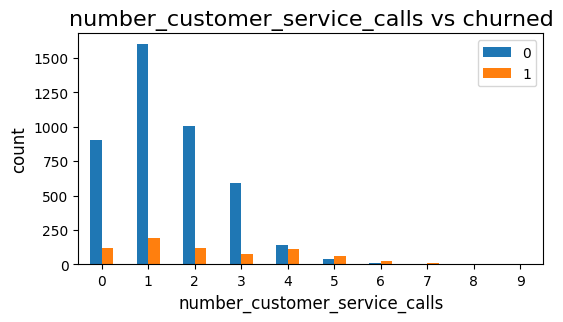

In [34]:
#number of customer service calls vs churning of customer
diff_bar('number_customer_service_calls','churned')

In [35]:
df2.corr()

,account_length,intl_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churned
account_length,1.000000,0.014681,-0.006650,-0.014575,-0.001017,0.028240,-0.001019,-0.009591,0.009143,-0.009496,0.000668,-0.007825,0.000656,0.001291,0.014277,0.001223,-0.001445,0.021203
intl_plan,0.014681,1.000000,0.009054,0.011947,0.028138,0.008102,0.028141,0.021235,0.002505,0.021123,-0.026508,0.005623,-0.026510,0.031799,0.004493,0.031545,-0.012974,0.259123
voice_mail_plan,-0.006650,0.009054,1.000000,0.954508,0.002059,-0.001735,0.002056,0.023328,-0.005916,0.023716,0.005524,0.009176,0.005522,0.004116,-0.007525,0.004054,-0.014453,-0.110698
number_vmail_messages,-0.014575,0.011947,0.954508,1.000000,0.005381,0.000883,0.005377,0.019490,-0.003954,0.019848,0.005541,0.002676,0.005535,0.002463,0.000124,0.002361,-0.007086,-0.097633
total_day_minutes,-0.001017,0.028138,0.002059,0.005381,1.000000,0.001935,1.000000,-0.010750,0.008128,-0.010821,0.011799,0.004236,0.011783,-0.019486,-0.001303,-0.019512,0.002733,0.207705
total_day_calls,0.028240,0.008102,-0.001735,0.000883,0.001935,1.000000,0.001936,-0.000699,0.003754,-0.000909,0.002804,-0.008308,0.002802,0.013097,0.010893,0.013216,-0.010739,0.016130
total_day_charge,-0.001019,0.028141,0.002056,0.005377,1.000000,0.001936,1.000000,-0.010747,0.008129,-0.010818,0.011801,0.004235,0.011785,-0.019490,-0.001307,-0.019516,0.002726,0.207700
total_eve_minutes,-0.009591,0.021235,0.023328,0.019490,-0.010750,-0.000699,-0.010747,1.000000,0.002763,0.999739,-0.016639,0.013420,-0.016642,0.000137,0.008388,0.000131,-0.013823,0.089288
total_eve_calls,0.009143,0.002505,-0.005916,-0.003954,0.008128,0.003754,0.008129,0.002763,1.000000,0.002861,0.001781,-0.013682,0.001799,-0.007458,0.005574,-0.007544,0.006235,-0.006284
total_eve_charge,-0.009496,0.021123,0.023716,0.019848,-0.010821,-0.000909,-0.010818,0.999739,0.002861,1.000000,-0.016851,0.013301,-0.016854,0.000477,0.008294,0.000471,-0.013899,0.089491


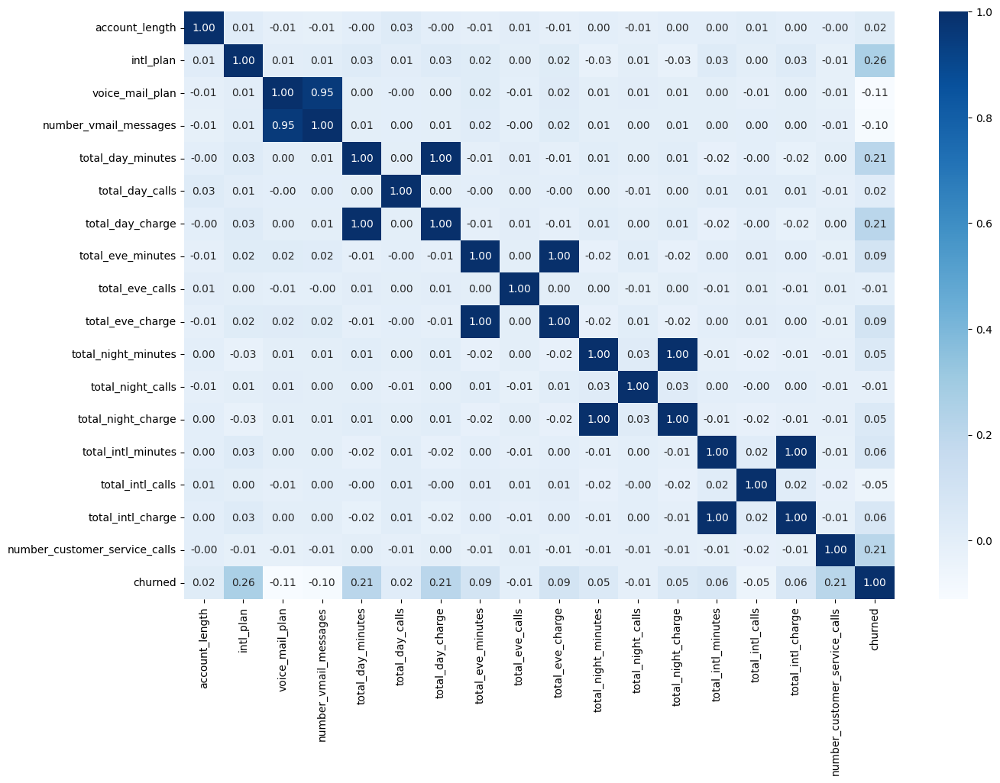

In [36]:
# Getting A Heatmap Co-Relating Various Columns
cor = df2.corr()
plt.figure(figsize=(15,10))
sns.heatmap(cor.round(3),annot=True,fmt=".2f",cmap='Blues')
plt.show()

The following four variables are highly correlated with other four variables in the dataset:

1. ```total_day_charge```
2. ```total_eve_charge```
3. ```total_night_charge```
4. ```total_intl_charge```

We will drop them.

### **4.4. Droping Unnecessary Variables**

In [37]:
df3 = df2.drop(['total_day_charge','total_eve_charge','total_night_charge','total_intl_charge'], axis = 1)

Let's see the columns which are left:

In [38]:
df3.columns

Index(['account_length', 'intl_plan', 'voice_mail_plan',
       'number_vmail_messages', 'total_day_minutes', 'total_day_calls',
       'total_eve_minutes', 'total_eve_calls', 'total_night_minutes',
       'total_night_calls', 'total_intl_minutes', 'total_intl_calls',
       'number_customer_service_calls', 'churned'],
      dtype='object')

In [39]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   account_length                 5000 non-null   int64  
 1   intl_plan                      5000 non-null   int64  
 2   voice_mail_plan                5000 non-null   int64  
 3   number_vmail_messages          5000 non-null   int64  
 4   total_day_minutes              5000 non-null   float64
 5   total_day_calls                5000 non-null   int64  
 6   total_eve_minutes              5000 non-null   float64
 7   total_eve_calls                5000 non-null   int64  
 8   total_night_minutes            5000 non-null   float64
 9   total_night_calls              5000 non-null   int64  
 10  total_intl_minutes             5000 non-null   float64
 11  total_intl_calls               5000 non-null   int64  
 12  number_customer_service_calls  5000 non-null   i

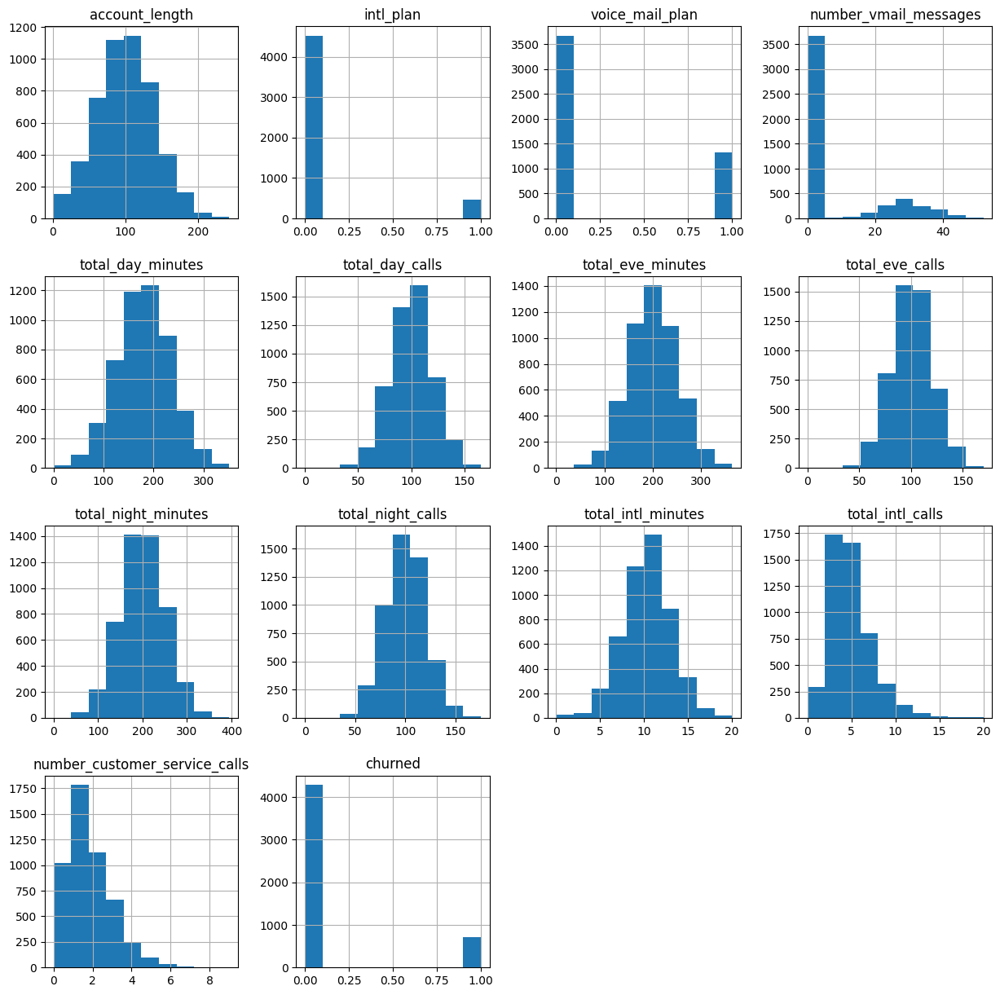

In [40]:
df3.hist(figsize = (15, 15))
plt.show()

- All the continuous variables have normal distributions, except ```number_vmail_messages```, ```total_intl_calls``` and ```number_customer_service_calls```.
- It seems like I do not need to transform any of the continuous variables.

Let us see the frequency distributions of the categorical variables.

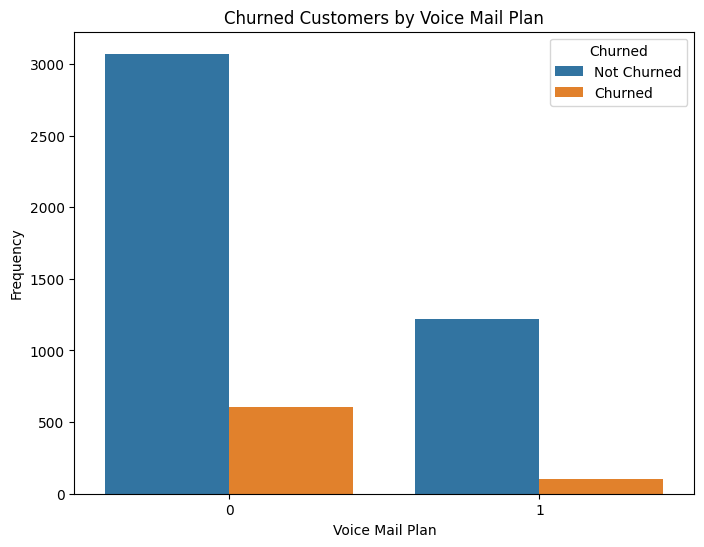

In [41]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df3, x='voice_mail_plan', hue='churned')

plt.title('Churned Customers by Voice Mail Plan')
plt.xlabel('Voice Mail Plan')
plt.ylabel('Frequency')
plt.legend(title='Churned', labels=['Not Churned', 'Churned'])
plt.show()


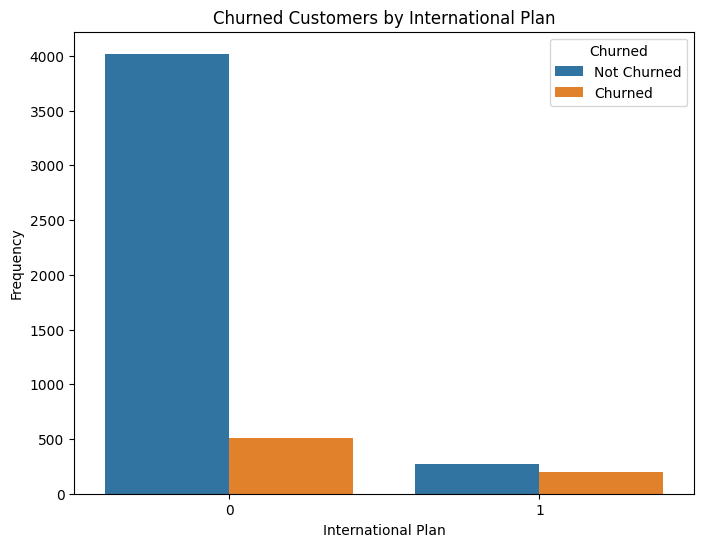

In [42]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df3, x='intl_plan', hue='churned')

plt.title('Churned Customers by International Plan')
plt.xlabel('International Plan')
plt.ylabel('Frequency')
plt.legend(title='Churned', labels=['Not Churned', 'Churned'])
plt.show()


## **5. Evaluate Algorithms**

### **5.1. Splitting dataset to X and output (Churn) to y**

In [43]:
X = df3.drop(["churned"], axis = "columns")
y = df3["churned"]

In [44]:
X.shape

(5000, 13)

In [45]:
y.shape

(5000,)

### **5.2. Train Test Split**

In [46]:
# Perform train/test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 150)

In [47]:
y_train.shape, y_test.shape

((3500,), (1500,))

### **5.3. Identify Feature Importance with a Random Forest Classifier**

In [48]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_train, y_train.values.ravel())

RandomForestClassifier()

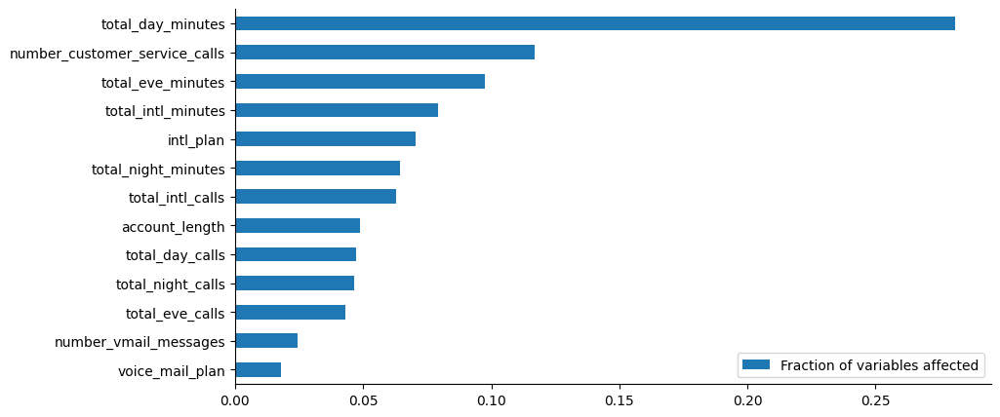

In [49]:
# Plot the feature importance

feat_scores= pd.DataFrame({"Fraction of variables affected" : rf.feature_importances_},index = X.columns)
feat_scores= feat_scores.sort_values(by = "Fraction of variables affected")
feat_scores.plot(kind = "barh", figsize = (10, 5))
sns.despine()

### **5.4. Train and Evaluate a Logistic Regressor**

In [50]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

model_LR = LogisticRegression(max_iter=100000)
        
model_LR.fit(X_train, y_train)

LogisticRegression(max_iter=100000)

In [51]:
y_predict = model_LR.predict(X_test)

In [52]:
# precision is the ratio of TP/(TP+FP)
# recall is the ratio of TP/(TP+FN)
# F-beta score can be interpreted as a weighted harmonic mean of the precision and recall
# where an F-beta score reaches its best value at 1 and worst score at 0. 
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92      1299
           1       0.46      0.20      0.28       201

    accuracy                           0.86      1500
   macro avg       0.67      0.58      0.60      1500
weighted avg       0.83      0.86      0.84      1500



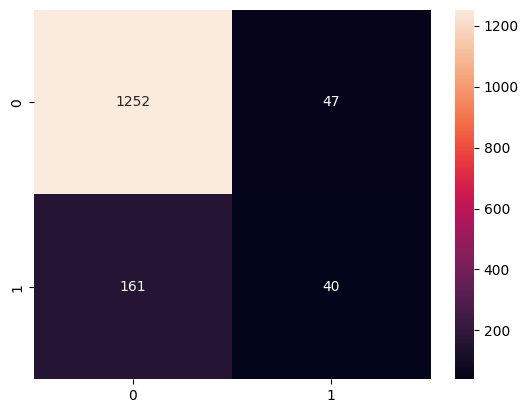

In [53]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True,fmt=".0f");

### **5.5. Train and Evaluate a Support Vector Machine**

In [54]:
from sklearn.calibration import CalibratedClassifierCV # For probability score output
from sklearn.svm import LinearSVC

model_svc = LinearSVC(max_iter=100000)
model_svm = CalibratedClassifierCV(model_svc) 
model_svm.fit(X_train, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


CalibratedClassifierCV(estimator=LinearSVC(max_iter=100000))

In [55]:
y_predict = model_svm.predict(X_test)

In [56]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.88      0.97      0.93      1299
           1       0.50      0.16      0.25       201

    accuracy                           0.87      1500
   macro avg       0.69      0.57      0.59      1500
weighted avg       0.83      0.87      0.84      1500



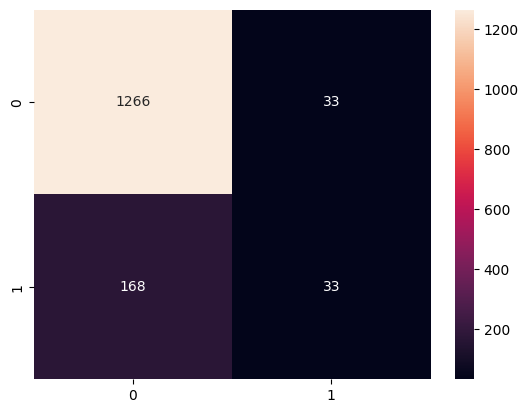

In [57]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True,fmt=".0f");

### **5.6. Train and Evaluate a Random Forest Classifier**

In [58]:
from sklearn.ensemble import RandomForestClassifier

model_rf = RandomForestClassifier()
model_rf.fit(X_train, y_train)

RandomForestClassifier()

In [59]:
y_predict = model_rf.predict(X_test)

In [60]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      1299
           1       0.90      0.72      0.80       201

    accuracy                           0.95      1500
   macro avg       0.93      0.85      0.89      1500
weighted avg       0.95      0.95      0.95      1500



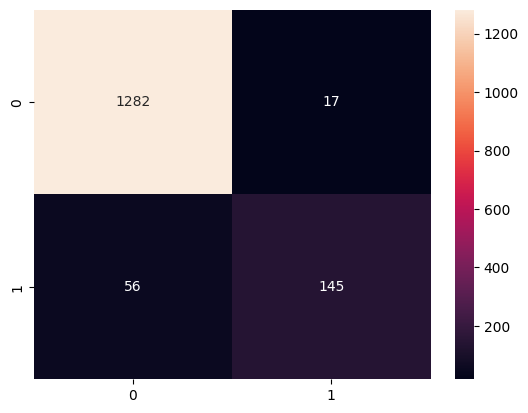

In [61]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True,fmt=".0f");

### **5.7. Train and Evaluate K-Nearest Neighbor (KNN) Classifier**

In [62]:
from sklearn.neighbors import KNeighborsClassifier

model_knn = KNeighborsClassifier()
model_knn.fit(X_train, y_train)

KNeighborsClassifier()

In [63]:
y_predict = model_knn.predict(X_test) 

In [64]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1299
           1       0.72      0.26      0.38       201

    accuracy                           0.89      1500
   macro avg       0.81      0.62      0.66      1500
weighted avg       0.87      0.89      0.86      1500



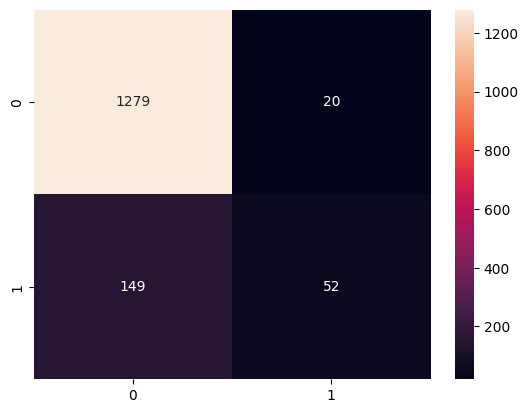

In [65]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True,fmt=".0f");

### **5.8. Train and Evaluate a Naive Bayes Classifier**

In [66]:
from sklearn.naive_bayes import GaussianNB

In [67]:
model_gnb = GaussianNB()
model_gnb.fit(X_train, y_train)

GaussianNB()

In [68]:
y_predict = model_gnb.predict(X_test)

In [69]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92      1299
           1       0.50      0.43      0.46       201

    accuracy                           0.87      1500
   macro avg       0.71      0.68      0.69      1500
weighted avg       0.86      0.87      0.86      1500



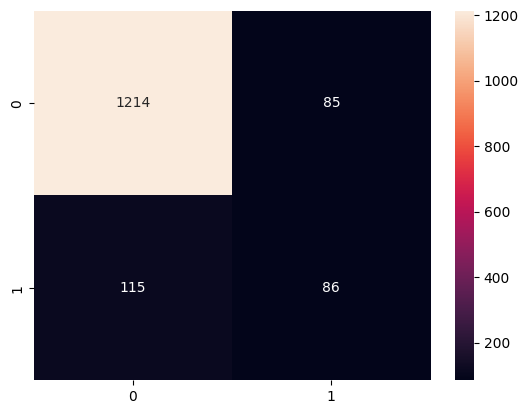

In [70]:
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot = True,fmt=".0f");

### **5.9. Compare Each Model with the ROC Curve**

In [71]:
from sklearn.metrics import roc_curve


In [72]:
# ROC curve

fpr1, tpr1, thresh1 = roc_curve(y_test, model_LR.predict_proba(X_test)[:, 1], pos_label = 1)
fpr2, tpr2, thresh2 = roc_curve(y_test, model_svm.predict_proba(X_test)[:, 1], pos_label = 1)
fpr3, tpr3, thresh3 = roc_curve(y_test, model_rf.predict_proba(X_test)[:, 1], pos_label = 1)
fpr4, tpr4, thresh4 = roc_curve(y_test, model_knn.predict_proba(X_test)[:, 1], pos_label = 1)
fpr5, tpr5, thresh5 = roc_curve(y_test, model_gnb.predict_proba(X_test)[:, 1], pos_label = 1)


In [73]:
# AUC score

from sklearn.metrics import roc_auc_score

auc_score1 = roc_auc_score(y_test, model_LR.predict_proba(X_test)[:, 1])
auc_score2 = roc_auc_score(y_test, model_svm.predict_proba(X_test)[:, 1])
auc_score3 = roc_auc_score(y_test, model_rf.predict_proba(X_test)[:, 1])
auc_score4 = roc_auc_score(y_test, model_knn.predict_proba(X_test)[:, 1])
auc_score5 = roc_auc_score(y_test, model_gnb.predict_proba(X_test)[:, 1])

print("Logistic Regression: ", auc_score1) # Logistic Regression
print("Support Vector Machine: ", auc_score2) # Support Vector Machine
print("Random Forest: ", auc_score3) # Random Forest
print("K-Nearest Neighbors: ", auc_score4) # K-Nearest Neighbors
print("Naive Bayes: ", auc_score5) # Naive Bayes

Logistic Regression:  0.7919869474796916
Support Vector Machine:  0.8145262907939134
Random Forest:  0.9097449626386925
K-Nearest Neighbors:  0.6503376114041033
Naive Bayes:  0.8326190448833585


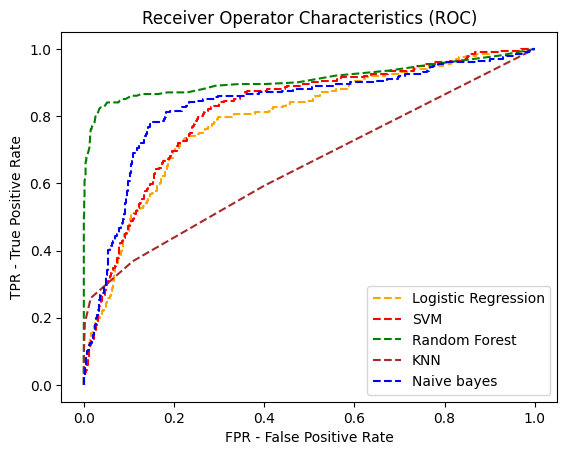

In [74]:
import matplotlib.pyplot as plt
plt.plot(fpr1, tpr1, linestyle = "--", color = "orange", label = "Logistic Regression")
plt.plot(fpr2, tpr2, linestyle = "--", color = "red", label = "SVM")
plt.plot(fpr3, tpr3, linestyle = "--", color = "green", label = "Random Forest")
plt.plot(fpr4, tpr4, linestyle = "--", color = "brown", label = "KNN")
plt.plot(fpr5, tpr5, linestyle = "--", color = "blue", label = "Naive bayes")

plt.title('Receiver Operator Characteristics (ROC)')
plt.xlabel('FPR - False Positive Rate')
plt.ylabel('TPR - True Positive Rate')

plt.legend(loc = 'best')
plt.savefig('ROC', dpi = 300)
plt.show()

### **5.10. Conclusion on Model Selection**

- The graph represents that Random Forest algorithm produced the best AUC (Area Under the Curve).
- It is clear that Random Forest Model did a better job of classifying the churned/retained telecom customers.

## **6. Important Features in Customer Churn**

###**6.1. Churn Rate by International Plan**

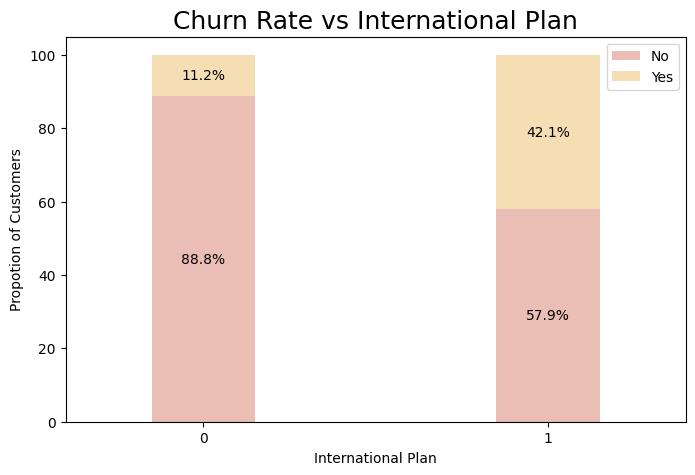

In [84]:
import matplotlib.ticker as mtick

intl_plan_churn = df3.groupby(['intl_plan','churned']).size().unstack()

intl_plan_churn.rename(columns={0:'No', 1:'Yes'}, inplace=True)
colors  = ['#eabeb4','#f5deb3']


ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.autoscale(enable=False, axis='both', tight=False)
ax = (intl_plan_churn.T*100.0 / 
      intl_plan_churn.T.sum()).T.plot(kind='bar',
      width = 0.3, stacked = True, rot = 0,
      figsize = (8,5), color = colors)


ax = plt.gca()
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, y+height/2,'{:.1f}%'.format(height), 
            horizontalalignment='center', fontsize = 10,
            verticalalignment='center')

plt.ylabel('Propotion of Customers')
plt.xlabel('International Plan')
plt.title('Churn Rate vs International Plan', fontsize = "18")
plt.xticks(rotation=0, horizontalalignment="center")
plt.yticks(rotation=0, horizontalalignment="right")
plt.legend()
plt.show()

###**6.2. Churn Rate by voice mail plan**

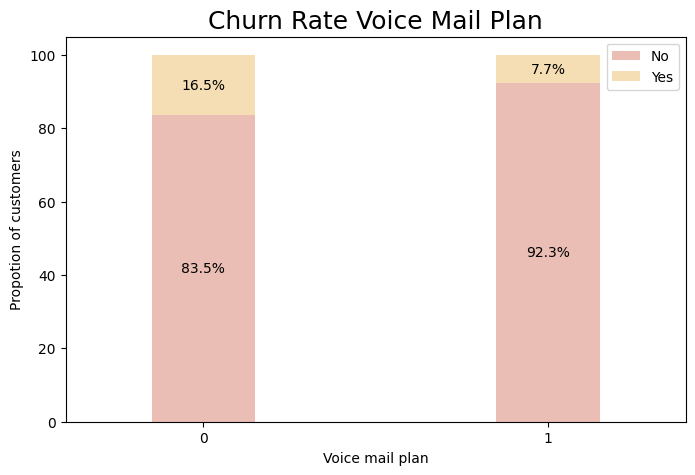

In [83]:
import matplotlib.ticker as mtick

voice_mail_plan_churn = df3.groupby(['voice_mail_plan','churned']).size().unstack()
voice_mail_plan_churn.rename(columns={0:'No', 1:'Yes'}, inplace=True)
colors  = ['#eabeb4','#f5deb3']

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.autoscale(enable=False, axis='both', tight=False)
ax = (voice_mail_plan_churn.T*100.0 / 
      voice_mail_plan_churn.T.sum()).T.plot(kind='bar',
      width = 0.3, stacked = True, rot = 0,
      figsize = (8,5), color = colors)

ax = plt.gca()

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, y+height/2,'{:.1f}%'.format(height), 
            horizontalalignment='center', fontsize = 10,
            verticalalignment='center')

plt.ylabel('Propotion of customers')
plt.xlabel('Voice mail plan')
plt.title('Churn Rate Voice Mail Plan', fontsize = "18")
plt.xticks(rotation=0, horizontalalignment="center")
plt.yticks(rotation=0, horizontalalignment="right")
plt.legend()
plt.show()

###**6.3. Churn Rate by number of customer service call**

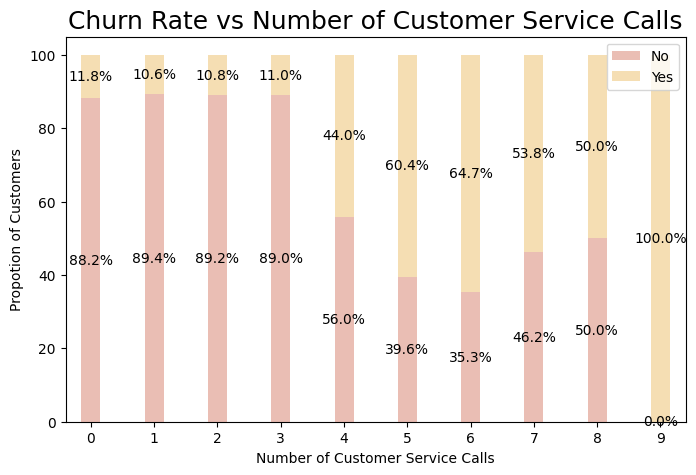

In [82]:
import matplotlib.ticker as mtick

number_customer_service_calls_churn = df3.groupby(['number_customer_service_calls','churned']).size().unstack()
number_customer_service_calls_churn.rename(columns={0:'No', 1:'Yes'}, inplace=True)
colors  = ['#eabeb4','#f5deb3']

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.autoscale(enable=False, axis='both', tight=False)
ax = (number_customer_service_calls_churn.T*100.0 / 
      number_customer_service_calls_churn.T.sum()).T.plot(kind='bar',
      width = 0.3, stacked = True, rot = 0,
      figsize = (8,5), color = colors)

ax = plt.gca()

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, y+height/2,'{:.1f}%'.format(height), 
            horizontalalignment='center', fontsize = 10,
            verticalalignment='center')

plt.ylabel('Propotion of Customers')
plt.xlabel('Number of Customer Service Calls')
plt.title('Churn Rate vs Number of Customer Service Calls', fontsize = "18")
plt.xticks(rotation=0, horizontalalignment="center")
plt.yticks(rotation=0, horizontalalignment="right")
plt.legend()
plt.show()

### **6.4. Conclusion on Churn Feature Importance**

- The customers with international contract plan have the higher probability to churn compared to the customers without this plan.
- The customers with voice mail plan has 16,5% probability to churn.
- The customers without voice mail plan has only 7,7% probability to churn.
- If the number of customer service calls is between 0-3, the probability to churn is the same between 10-12%, very low.
- If the number of customer service calls is between 4-8, the probability for the customer to churn is 35,3-56%.
- If the number of customer service calls is 9 (or more, I guess), the probability for the customer to churn is very hight